# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [2]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)


In [3]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

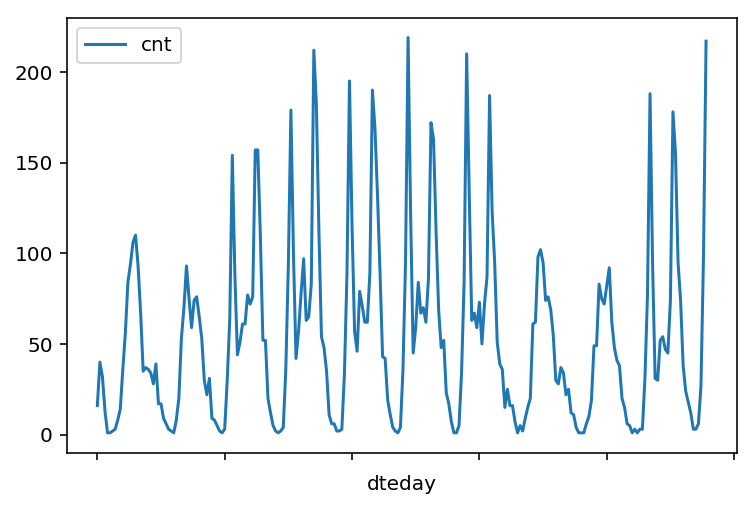

In [4]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [5]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [6]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [7]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [8]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure. You'll implement both the forward pass and backwards pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [9]:
#############
# In the my_answers.py file, fill out the TODO sections as specified
#############


from my_answers import NeuralNetwork

In [10]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [11]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        
        network.weights_input_to_hidden = test_w_i_h.copy()
        print("network.weights_input_to_hidden: ",network.weights_input_to_hidden)
        network.weights_hidden_to_output = test_w_h_o.copy()
        print("network.weights_hidden_to_output: ", network.weights_hidden_to_output)
        print("inputs: ", inputs, inputs.shape)
        print("targets: ", targets, targets.shape)
        print("\n\n\n")
        network.train(inputs, targets)

        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

...FF

network.weights_input_to_hidden:  [[ 0.1 -0.2]
 [ 0.4  0.5]
 [-0.3  0.2]]
network.weights_hidden_to_output:  [[ 0.3]
 [-0.1]]
inputs:  [[ 0.5 -0.2  0.1]] (1, 3)
targets:  [[0.4]] (1, 1)






error:
y - final_outputs
[0.4]  -  [0.5249765]  =  [-0.1249765]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.1249765]  *  [0.5249765]  *  [0.4750235]  =  [-0.03116616]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[ 0.3]
 [-0.1]]  o  [-0.03116616]  *  [0.4850045  0.45512111]  *  [0.5149955  0.54487889]  =  [-0.00233536  0.00077288]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.00233536  0.00077288]  *  [0.4850045  0.45512111]  *  [0.5149955  0.54487889]  =  [-0.00058331  0.00019166]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (3, 1)
delta_weights_i_h.shape: (3, 2)
[-0.00058331  0.00019166]  *  [[ 0.5]
 [-0.2]
 [ 0.1]]  =  [[-2


FAIL: test_run (__main__.TestMethods)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "<ipython-input-11-50b93569e6ec>", line 62, in test_run
    self.assertTrue(np.allclose(network.run(inputs), 0.09998924))
AssertionError: False is not true

FAIL: test_train (__main__.TestMethods)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "<ipython-input-11-50b93569e6ec>", line 49, in test_train
    [-0.03172939]])))
AssertionError: False is not true

----------------------------------------------------------------------
Ran 5 tests in 0.011s

FAILED (failures=2)


<unittest.runner.TextTestResult run=5 errors=0 failures=2>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, this process can have sharply diminishing returns and can waste computational resources if you use too many iterations.  You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. The ideal number of iterations would be a level that stops shortly after the validation loss is no longer decreasing.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. Normally a good choice to start at is 0.1; however, if you effectively divide the learning rate by n_records, try starting out with a learning rate of 1. In either case, if the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
In a model where all the weights are optimized, the more hidden nodes you have, the more accurate the predictions of the model will be.  (A fully optimized model could have weights of zero, after all.) However, the more hidden nodes you have, the harder it will be to optimize the weights of the model, and the more likely it will be that suboptimal weights will lead to overfitting. With overfitting, the model will memorize the training data instead of learning the true pattern, and won't generalize well to unseen data.  

Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.  You'll generally find that the best number of hidden nodes to use ends up being between the number of input and output nodes.

In [ ]:
import sys

####################
### Set the hyperparameters in youR myanswers.py file ###
####################

from my_answers import iterations, learning_rate, hidden_nodes, output_nodes


N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:17: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated




error:
y - final_outputs
1.4914851606172022  -  [0.41553494]  =  [1.07595022]


output_error_term:
error * final_outputs * (1-final_outputs)
[1.07595022]  *  [0.41553494]  *  [0.58446506]  =  [0.26131135]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41019655]
 [-0.38366336]]  o  [0.26131135]  *  [0.42830182 0.43121759]  *  [0.57169818 0.56878241]  =  [-0.02624623 -0.02458959]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02624623 -0.02458959]  *  [0.42830182 0.43121759]  *  [0.57169818 0.56878241]  =  [-0.00642664 -0.00603106]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00642664 -0.00603106]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.26203639]
 [-0.40029496]
 [ 0.27629827]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        

[0.03221249 0.03049167]  *  [0.55540276 0.50979032]  *  [0.44459724 0.49020968]  =  [0.00795425 0.00762   ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00795425 0.00762   ]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.4311098 ]
 [ 1.31017145]
 [-0.69966852]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

[0.02473878 0.021977  ]  *  [0.49636422 0.61208372]  *  [0.50363578 0.38791628]  =  [0.00618437 0.00521816]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00618437 0.00521816]  *  [[ 1.        ]
 [ 0.        ]
 [-0.60754843]
 [ 1.25833914]
 [ 0.88607317]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

 [-0.38366336]]  o  [-0.21894686]  *  [0.5019857  0.47004918]  *  [0.4980143  0.52995082]  =  [0.02245246 0.02092512]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02245246 0.02092512]  *  [0.5019857  0.47004918]  *  [0.4980143  0.52995082]  =  [0.00561303 0.00521251]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00561303 0.00521251]  *  [[ 0.        ]
 [ 0.        ]
 [-0.81528007]
 [-2.26625831]
 [ 0.51988127]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

 [0.45760285]]  =  [[0.31976841]
 [0.33233769]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.18955169]
 [-3.5201744 ]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.2726927743800753  -  [0.41560485]  =  [-0.68829762]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.68829762]  *  [0.41560485]  *  [0.58439515]  =  [-0.16717198]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41019655]
 [-0.38366336]]  o  [-0.16717198]  *  [0.41555448 0.4440962 ]  *  [0.58444552 0.5559038 ]  =  [0.01665434 0.015834  ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01665434 0.015834  ]  *  [0.41555448 0.4440962 ]  *  [0.58444552 0.5559038 ]  =  [0.00404482 0.00390901]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00404482 0.00390901]  *  [[0.        ]
 [0.        ]
 [1.36

[0.00055178 0.00048882]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.57363386]
 [-0.5557919 ]
 [ 0.03189788]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]]  =  [[ 5.51779045e-04  4.88824332e-04]
 [ 0.00000000e+00  0.00000000e+00]
 [ 8.68298186e-04  7.69230519e-04]
 [-3.06674325e-04 -2.7

 [-0.38366336]]  o  [-0.34142121]  *  [0.41217021 0.38269595]  *  [0.58782979 0.61730405]  =  [0.0339321  0.03094524]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0339321  0.03094524]  *  [0.41217021 0.38269595]  *  [0.58782979 0.61730405]  =  [0.00822127 0.0073105 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00822127 0.0073105 ]  *  [[ 0.        ]
 [ 0.        ]
 [-0.39981678]
 [-3.2510723 ]
 [ 0.27629827]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-1.0390075648945178  -  [0.38166366]  =  [-1.42067123]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.42067123]  *  [0.38166366]  *  [0.61833634]  =  [-0.33527345]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41019655]
 [-0.38366336]]  o  [-0.33527345]  *  [0.5928641  0.62372902]  *  [0.4071359  0.37627098]  =  [0.033196   0.03018882]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.033196   0.03018882]  *  [0.5928641  0.62372902]  *  [0.4071359  0.37627098]  =  [0.00801273 0.00708505]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00801273 0.00708505]  *  [[ 0.        ]
 [ 0.        ]
 [-1.43847501]
 [ 0.89551293]
 [ 0.88607317]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]

Progress: 0.0% ... Training loss: 1.137 ... Validation loss: 1.295

error:
y - final_outputs
-0.9673378362852534  -  [0.39654645]  =  [-1.36388429]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.36388429]  *  [0.39654645]  *  [0.60345355]  =  [-0.32637392]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [-0.32637392]  *  [0.50748222 0.53653593]  *  [0.49251778 0.46346407]  =  [0.03391268 0.03159934]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03391268 0.03159934]  *  [0.50748222 0.53653593]  *  [0.49251778 0.46346407]  =  [0.00847627 0.00785766]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00847627 0.00785766]  *  [[0.        ]
 [0.        ]
 [0.8465731 ]
 [1.36200377]
 [0.76428167]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [1.

[0.02955042 0.02875815]  *  [0.40243069 0.51092037]  *  [0.59756931 0.48907963]  =  [0.00710629 0.00718611]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00710629 0.00718611]  *  [[1.        ]
 [0.        ]
 [0.8465731 ]
 [0.58451904]
 [0.03189788]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.     

 [-1.92121060e-02 -1.76791867e-02]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.40332193]  *  [[0.41651419]
 [0.40456996]]  =  [[0.16798931]
 [0.16317194]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.56873346]
 [-0.5720555 ]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.6623898980700635  -  [0.42671406]  =  [1.23567584]


output_error_term:
error * final_outputs * (1-final_outputs)
[1.23567584]  *  [0.42671406]  *  [0.57328594]  =  [0.30228236]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [0.30228236]  *  [0.31545385 0.42153904]  *  [0.68454615 0.57846096]  =  [-0.02713659 -0.02869937]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02713659 -0.02869937]  *  [0.31545385 0.42153

[0.00279454 0.00201802]  *  [[1.        ]
 [0.        ]
 [0.01564651]
 [1.62116534]
 [0.88607317]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]]  =  [[2.79453934e-03 2.01802264e-03]
 [0.00000000e+00 0.00000000e+00]
 [4.37247921e-05 3.15750147e-05]
 [4.53041033e-03 3.27154837e-03]
 [2.47616632e-03 1.78811571e-03]
 [0.00000000e+00 0

delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-1.12846869]
 [-1.11548694]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.9291534438368201  -  [0.41887253]  =  [0.51028091]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.51028091]  *  [0.41887253]  *  [0.58112747]  =  [0.12421173]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [0.12421173]  *  [0.31884689 0.50044467]  *  [0.68115311 0.49955533]  =  [-0.01121485 -0.01209066]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01121485 -0.01209066]  *  [0.31884689 0.50044467]  *  [0.68115311 0.49955533]  =  [-0.00243568 -0.00302266]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00243568 -0.00302266]  *  [[ 1.        ]
 [ 0.        ]
 [-0.71141425]
 [-0.86678579]
 [ 1.13047356]
 [ 0

 [-0.         -0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[-8.19998138e-03 -1.10987988e-02]
 [ 0.00000000e+00  0.00000000e+00]
 [-6.89712717e-02 -6.60579647e-02]
 [ 9.39700848e-02  9.07887288e-02]
 [-1.93669096e-02 -2.31958712e-02]
 [ 3.16384284e-02  2.89602488e-02]
 [ 6.92320165e-03  6.34494843e-03]
 [-4.90880013e-03 -6.02443198e-03]
 [ 1.10684279e-02  1.07819197e-02]
 [ 1.92171342e-02  1.65166697e-02]
 [ 1.80128913e-02  1.64733689e-02]
 [ 7.49123240e-03  7.07264639e-03]
 [ 0.00000000e+00  0.00000000e+00]
 [ 4.59643328e-03  3.70306948e-03]
 [ 1.98294493e-02  1.76932274e-02]
 [ 1.62735703e-02  1.47565326e-02]
 [ 1.55753185e-03  1.41092565e-03]
 [ 1.21494239e-03  2.10858537e-03]
 [-3.42896628e-03 -2.98082889e-03]
 [ 2.33714795e-03  2.76033622e-03]
 [-6.68024209e-03 -8.20480238e-03]
 [ 1.28443549e-02  1.22837276e-02]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [-3.82296376e-03 -3.46808817e-03]
 [ 1.81244396e-02  1.81670403e



error:
y - final_outputs
0.1793778214629771  -  [0.38363878]  =  [-0.20426096]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.20426096]  *  [0.38363878]  *  [0.61636122]  =  [-0.04829956]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [-0.04829956]  *  [0.52880561 0.65311609]  *  [0.47119439 0.34688391]  =  [0.00500315 0.00426055]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00500315 0.00426055]  *  [0.52880561 0.65311609]  *  [0.47119439 0.34688391]  =  [0.00124664 0.00096525]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00124664 0.00096525]  *  [[ 0.        ]
 [ 0.        ]
 [-1.12687754]
 [-0.91861811]
 [ 0.27629827]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [

 [-0.38935679]]  o  [0.42091699]  *  [0.43852734 0.32560266]  *  [0.56147266 0.67439734]  =  [-0.04308496 -0.0359872 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.04308496 -0.0359872 ]  *  [0.43852734 0.32560266]  *  [0.56147266 0.67439734]  =  [-0.01060843 -0.00790227]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.01060843 -0.00790227]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.46976803]
 [-1.54060589]
 [ 0.76428167]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 

(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[-0.01558743 -0.01162291]
 [ 0.          0.        ]
 [-0.15477374 -0.13465368]
 [ 0.1850249   0.1589844 ]
 [ 0.00844451 -0.00704207]
 [ 0.0651969   0.06111757]
 [ 0.02518274  0.0239391 ]
 [-0.02586589 -0.01784147]
 [ 0.00040692  0.00099568]
 [ 0.02818735  0.03567808]
 [ 0.02384587  0.02139053]
 [ 0.01288745  0.01114226]
 [ 0.          0.        ]
 [ 0.01339323  0.01114037]
 [ 0.02272099  0.02118493]
 [ 0.03002228  0.02879932]
 [ 0.02224966  0.01917567]
 [ 0.00939077  0.00984025]
 [-0.00929271 -0.00552278]
 [ 0.00041252  0.00081134]
 [-0.00638073 -0.00766785]
 [-0.02190933 -0.01331704]
 [-0.00268973 -0.00253872]
 [ 0.          0.        ]
 [ 0.00700371  0.00630538]
 [ 0.02624586  0.02535257]
 [ 0.02369837  0.02221241]
 [ 0.01547703  0.01396455]
 [ 0.00880354  0.0077187 ]
 [ 0.01699682  0.01599901]
 [ 0.03735811  0.03557372]
 [ 0.01322096  0.01321798]
 [ 0.00674415  0.00420658]
 [-0.02440576 -0.02272367]
 [-0.00087966 -

-1.0114422846601854  -  [0.42380039]  =  [-1.43524267]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.43524267]  *  [0.42380039]  *  [0.57619961]  =  [-0.3504771]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [-0.3504771]  *  [0.32122999 0.44598923]  *  [0.67877001 0.55401077]  =  [0.03176891 0.03371708]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03176891 0.03371708]  *  [0.32122999 0.44598923]  *  [0.67877001 0.55401077]  =  [0.00692693 0.00833091]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00692693 0.00833091]  *  [[ 0.        ]
 [ 0.        ]
 [-0.5036826 ]
 [-2.36992294]
 [ 1.86203995]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]


 [ 2.02021074e-02  1.94993446e-02]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.13136613]  *  [[0.7012062 ]
 [0.58626214]]  =  [[0.09211474]
 [0.07701499]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.94022375]
 [-3.44420042]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.35365875944554  -  [0.40936052]  =  [0.94429824]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.94429824]  *  [0.40936052]  *  [0.59063948]  =  [0.22831666]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [0.22831666]  *  [0.46418655 0.4459576 ]  *  [0.53581345 0.5540424 ]  =  [-0.02360737 -0.02196453]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02360737 -0.02196453]  *  [0.46418655 0.4459576

-1.0390075648945178  -  [0.37752967]  =  [-1.41653723]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.41653723]  *  [0.37752967]  *  [0.62247033]  =  [-0.33288769]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [-0.33288769]  *  [0.6783096  0.56004673]  *  [0.3216904  0.43995327]  =  [0.03019727 0.03193569]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03019727 0.03193569]  *  [0.6783096  0.56004673]  *  [0.3216904  0.43995327]  =  [0.00658922 0.00786877]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00658922 0.00786877]  *  [[ 0.        ]
 [ 0.        ]
 [-1.33460919]
 [ 0.1180282 ]
 [-0.45608552]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        

[0.0298618  0.02919733]  *  [0.60389284 0.4833089 ]  *  [0.39610716 0.5166911 ]  =  [0.00714313 0.0072912 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00714313 0.0072912 ]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.53497563]
 [ 0.32535746]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 



delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.25881648]  *  [[0.56362414]
 [0.35761337]]  =  [[-0.14587521]
 [-0.09255623]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-4.49769482]
 [-4.92129096]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.9452856120977874  -  [0.39567909]  =  [-1.3409647]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.3409647]  *  [0.39567909]  *  [0.60432091]  =  [-0.32064765]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.41572286]
 [-0.38935679]]  o  [-0.32064765]  *  [0.47133406 0.58444476]  *  [0.52866594 0.41555524]  =  [0.0332156  0.03032132]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0332156  0.03032132]  *  [0.47133406 0.58444476]  *  [0.52866594 0.41555524]  =  [0.00827661 0.00736411]


hidd

 [ 0.          0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 0.01581299  0.02395791]
 [ 0.00200035  0.00195151]
 [-0.28484352 -0.25442338]
 [ 0.30110361  0.25187151]
 [ 0.03158346  0.02439995]
 [ 0.1568134   0.1513484 ]
 [ 0.04453492  0.04375406]
 [-0.01338558 -0.00239441]
 [ 0.0224478   0.02028328]
 [ 0.11202955  0.1243392 ]
 [ 0.03077232  0.02801089]
 [ 0.06760868  0.06064124]
 [ 0.          0.        ]
 [ 0.03091738  0.0295991 ]
 [ 0.06510573  0.06378414]
 [ 0.05249513  0.0490678 ]
 [ 0.02220168  0.02008606]
 [ 0.02237194  0.02170698]
 [-0.00281934  0.00409241]
 [ 0.00114246  0.00130947]
 [-0.00401361 -0.00326312]
 [-0.0031956   0.00336356]
 [-0.00952554 -0.00909595]
 [ 0.0096845   0.00888155]
 [ 0.02604584  0.02345933]
 [ 0.033389    0.03264376]
 [ 0.06028792  0.05643432]
 [ 0.0328991   0.02983219]
 [ 0.02338175  0.02271631]
 [ 0.03175033  0.03227525]
 [ 0.06113437  0.05820669]
 [ 0.02349664  0.02467959]
 [ 0.01405615  0.01112822]
 [-0.01759431 

[0.01683949 0.01551935]  *  [0.45067109 0.42005486]  *  [0.54932891 0.57994514]  =  [0.0041689  0.00378065]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0041689  0.00378065]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.05430474]
 [ 0.37718977]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

Progress: 1.0% ... Training loss: 1.136 ... Validation loss: 1.295

error:
y - final_outputs
0.11322114890057919  -  [0.38261612]  =  [-0.26939497]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.26939497]  *  [0.38261612]  *  [0.61738388]  =  [-0.06363676]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.06363676]  *  [0.57714253 0.59945438]  *  [0.42285747 0.40054562]  =  [0.00652073 0.00601897]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00652073 0.00601897]  *  [0.57714253 0.59945438]  *  [0.42285747 0.40054562]  =  [0.00159138 0.00144521]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00159138 0.00144521]  *  [[ 0.        ]
 [ 0.        ]
 [-0.39981678]
 [ 1.62116534]
 [ 0.88607317]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.     

delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.22089618]  *  [[0.50366692]
 [0.68527779]]  =  [[-0.1112581 ]
 [-0.15137524]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.70432089]
 [-0.82283648]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.5080243287578017  -  [0.40815905]  =  [1.09986528]


output_error_term:
error * final_outputs * (1-final_outputs)
[1.09986528]  *  [0.40815905]  *  [0.59184095]  =  [0.26568922]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [0.26568922]  *  [0.45201633 0.46150313]  *  [0.54798367 0.53849687]  =  [-0.02763166 -0.02600985]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02763166 -0.02600985]  *  [0.45201633 0.46150313]  *  [0.54798367 0.53849687] 

 [-0.39391819]]  o  [-0.25421095]  *  [0.55198471 0.67342807]  *  [0.44801529 0.32657193]  =  [0.02639522 0.02202269]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02639522 0.02202269]  *  [0.55198471 0.67342807]  *  [0.44801529 0.32657193]  =  [0.00652748 0.00484329]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00652748 0.00484329]  *  [[0.        ]
 [0.        ]
 [0.22337816]
 [1.31017145]
 [1.13047356]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 

 [0.         0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[-0.02433866 -0.02455734]
 [-0.00347076 -0.00283138]
 [-0.08749575 -0.08819683]
 [ 0.04038974  0.0332389 ]
 [ 0.0271602   0.01940313]
 [ 0.03600368  0.03562128]
 [ 0.00392106  0.00468324]
 [-0.03118438 -0.03432773]
 [ 0.02105141  0.01722384]
 [ 0.02220172  0.01808377]
 [-0.00632486 -0.0052191 ]
 [ 0.01391491  0.01033596]
 [ 0.          0.        ]
 [ 0.00567391  0.00576144]
 [ 0.01918292  0.01891314]
 [ 0.01114684  0.0109467 ]
 [ 0.00081781  0.00075429]
 [-0.00045754  0.00028964]
 [ 0.00697335  0.00686743]
 [-0.01133698 -0.01302777]
 [-0.01156558 -0.01195609]
 [-0.00855193 -0.00984675]
 [ 0.00691358  0.00419872]
 [ 0.00565876  0.00559792]
 [ 0.00533662  0.00470195]
 [ 0.0143208   0.01316382]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00845702  0.00794929]
 [ 0.          0.        ]
 [-0.00158947 -0.00151672]
 [-0.02769168 -0

 [1.        ]]  =  [[0.00608969 0.00566453]
 [0.         0.        ]
 [0.00452286 0.00420709]
 [0.00482211 0.00448545]
 [0.00019425 0.00018069]
 [0.         0.        ]
 [0.         0.        ]
 [0.00608969 0.00566453]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.00608969 0.00566453]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.00608969 0.00566453]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.00608969 0.00566453]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.  

 [ 0.00509524  0.00699397]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.2966043]  *  [[0.58322543]
 [0.56940575]]  =  [[-0.17298717]
 [-0.1688882 ]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.18781781]
 [-2.15708728]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.3443625029893397  -  [0.43095158]  =  [-0.77531409]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.77531409]  *  [0.43095158]  *  [0.56904842]  =  [-0.19013207]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.19013207]  *  [0.25898652 0.429607  ]  *  [0.74101348 0.570393  ]  =  [0.01532039 0.018353  ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01532039 0.018353  ]  *  [0.25898652 0.429607  ] 

-0.9177203318634549  -  [0.41521851]  =  [-1.33293884]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.33293884]  *  [0.41521851]  *  [0.58478149]  =  [-0.32365368]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.32365368]  *  [0.32276257 0.52527698]  *  [0.67723743 0.47472302]  =  [0.02970406 0.03179181]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02970406 0.03179181]  *  [0.32276257 0.52527698]  *  [0.67723743 0.47472302]  =  [0.00649292 0.00792764]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00649292 0.00792764]  *  [[ 1.        ]
 [ 0.        ]
 [-1.12687754]
 [-0.91861811]
 [ 2.10644035]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        

[0.01009037 0.00866126]  *  [0.56621906 0.34099035]  *  [0.43378094 0.65900965]  =  [0.00247835 0.00194632]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00247835 0.00194632]  *  [[ 1.        ]
 [ 0.        ]
 [-0.81528007]
 [-0.08930106]
 [-0.69966852]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 

 [ 0.        ]]  =  [[ 0.00724062  0.00742151]
 [ 0.          0.        ]
 [-0.0096634  -0.00990482]
 [ 0.00911116  0.00933878]
 [-0.00594788 -0.00609648]
 [ 0.00724062  0.00742151]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00724062  0.00742151]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00724062  0.00742151]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00724062  0.00742151]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.   

[-0.02182383 -0.02022235]  *  [0.4446802  0.57815593]  *  [0.5553198  0.42184407]  =  [-0.00538917 -0.00493206]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00538917 -0.00493206]  *  [[ 1.        ]
 [ 0.        ]
 [-0.29595096]
 [ 1.31017145]
 [ 0.03189788]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.       

hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.21312073]  *  [[0.51238649]
 [0.48134345]]  =  [[-0.10920018]
 [-0.10258427]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-5.80847451]
 [-5.76877491]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.7798939306917927  -  [0.40775597]  =  [-1.1876499]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.1876499]  *  [0.40775597]  *  [0.59224403]  =  [-0.28680681]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.28680681]  *  [0.4562192  0.46126008]  *  [0.5437808  0.53873992]  =  [0.02987433 0.02807505]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02987433 0.02807505]  *  [0.4562192  0.46126008]  *  [0.5437808  0.53873992]  =  [0.00741132 0.00697663]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (

[-0.68132975]  *  [0.37555864]  *  [0.62444136]  =  [-0.1597816]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.1597816]  *  [0.57895832 0.67363632]  *  [0.42104168 0.32636368]  =  [0.01635349 0.01383758]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01635349 0.01383758]  *  [0.57895832 0.67363632]  *  [0.42104168 0.32636368]  =  [0.00398642 0.0030422 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00398642 0.0030422 ]  *  [[ 0.        ]
 [ 0.        ]
 [-0.08821931]
 [ 1.31017145]
 [ 1.13047356]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        



hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-1.63178644e-05 -1.84306125e-05]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.01564651]
 [ 1.93215924]
 [-1.55384381]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.      

delta_weights_h_o.shape: (2, 1)
[-0.0417445]  *  [[0.59792793]
 [0.51725388]]  =  [[-0.0249602]
 [-0.0215925]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-7.46450469]
 [-7.30242275]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.2378845824613438  -  [0.39860627]  =  [0.83927831]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.83927831]  *  [0.39860627]  *  [0.60139373]  =  [0.20119122]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [0.20119122]  *  [0.51925677 0.4906023 ]  *  [0.48074323 0.5093977 ]  =  [-0.02108704 -0.01980622]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02108704 -0.01980622]  *  [0.51925677 0.4906023 ]  *  [0.48074323 0.5093977 ]  =  [-0.00526394 -0.00494981]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2

[-0.79310216]  *  [0.38258298]  *  [0.61741702]  =  [-0.18734123]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.4198665 ]
 [-0.39391819]]  o  [-0.18734123]  *  [0.61141442 0.56328107]  *  [0.38858558 0.43671893]  =  [0.01868818 0.01815376]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01868818 0.01815376]  *  [0.61141442 0.56328107]  *  [0.38858558 0.43671893]  =  [0.00444006 0.00446574]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00444006 0.00446574]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.01564651]
 [ 1.31017145]
 [-0.82146002]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.      

Progress: 2.0% ... Training loss: 1.135 ... Validation loss: 1.294

error:
y - final_outputs
-1.0390075648945178  -  [0.3901943]  =  [-1.42920187]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.42920187]  *  [0.3901943]  *  [0.6098057]  =  [-0.34006816]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.34006816]  *  [0.62564998 0.45054354]  *  [0.37435002 0.54945646]  =  [0.03391292 0.0336528 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03391292 0.0336528 ]  *  [0.62564998 0.45054354]  *  [0.37435002 0.54945646]  =  [0.00794282 0.00833089]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00794282 0.00833089]  *  [[ 1.        ]
 [ 0.        ]
 [-1.43847501]
 [ 0.89551293]
 [-0.45608552]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        

 [-0.39974695]]  o  [0.02927427]  *  [0.54394127 0.44409452]  *  [0.45605873 0.55590548]  =  [-0.00309207 -0.002889  ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.00309207 -0.002889  ]  *  [0.54394127 0.44409452]  *  [0.45605873 0.55590548]  =  [-0.00076705 -0.00071322]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00076705 -0.00071322]  *  [[1.        ]
 [0.        ]
 [0.53497563]
 [0.7918483 ]
 [0.03189788]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.    

delta_weights_i_h: [[ 1.23433008e-02  1.39142249e-02]
 [ 8.42943227e-03  8.39498575e-03]
 [-2.24536842e-02 -2.09314589e-02]
 [ 2.82561041e-02  2.65778150e-02]
 [-4.57942105e-02 -4.51368650e-02]
 [ 1.90787118e-02  1.92148444e-02]
 [-6.30952908e-03 -5.01132161e-03]
 [ 2.35223874e-02  2.38502108e-02]
 [ 0.00000000e+00  0.00000000e+00]
 [ 3.62915701e-02  3.80537335e-02]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [ 8.85531412e-03  8.68428365e-03]
 [ 7.94281668e-03  8.33088695e-03]
 [ 2.28058097e-03  2.19967377e-03]
 [ 0.00000000e+00  0.00000000e+00]
 [-1.20003878e-02 -1.04492290e-02]
 [ 1.32938286e-02  1.28972452e-02]
 [ 7.48998533e-03  7.99588721e-03]
 [ 0.00000000e+00  0.00000000e+00]
 [ 8.42943227e-03  8.39498575e-03]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [ 7.60296980e-03  7.45933782e-03]
 [ 5.69085875e-03  5.43790740e-03]
 [ 0.00000000e+00  0.00000000e+00]
 

0.1021950368068462  -  [0.37399954]  =  [-0.27180451]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.27180451]  *  [0.37399954]  *  [0.62600046]  =  [-0.06363593]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.06363593]  *  [0.62520111 0.62263265]  *  [0.37479889 0.37736735]  =  [0.00634907 0.00597701]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00634907 0.00597701]  *  [0.62520111 0.62263265]  *  [0.37479889 0.37736735]  =  [0.00148774 0.00140436]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00148774 0.00140436]  *  [[ 0.        ]
 [ 0.        ]
 [-0.29595096]
 [ 1.31017145]
 [ 0.27629827]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]

y - final_outputs
-0.6089891932389314  -  [0.40420779]  =  [-1.01319698]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.01319698]  *  [0.40420779]  *  [0.59579221]  =  [-0.244002]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.244002]  *  [0.41946163 0.52373775]  *  [0.58053837 0.47626225]  =  [0.02529919 0.0243298 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02529919 0.0243298 ]  *  [0.41946163 0.52373775]  *  [0.58053837 0.47626225]  =  [0.00616069 0.00606874]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00616069 0.00606874]  *  [[ 0.        ]
 [ 0.        ]
 [-0.9191459 ]
 [-0.29663033]
 [ 1.61845695]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]

[-0.41571798]  *  [0.41867801]  *  [0.58132199]  =  [-0.10118024]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.10118024]  *  [0.37111852 0.42573459]  *  [0.62888148 0.57426541]  =  [0.01005465 0.00988855]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01005465 0.00988855]  *  [0.37111852 0.42573459]  *  [0.62888148 0.57426541]  =  [0.00234665 0.0024176 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00234665 0.0024176 ]  *  [[1.        ]
 [0.        ]
 [0.74270727]
 [0.1180282 ]
 [0.03189788]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0. 

 [-2.2029739]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.4491105678798031  -  [0.41555445]  =  [-0.86466501]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.86466501]  *  [0.41555445]  *  [0.58444555]  =  [-0.21000028]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.21000028]  *  [0.39104326 0.43665066]  *  [0.60895674 0.56334934]  =  [0.02129223 0.02064985]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02129223 0.02064985]  *  [0.39104326 0.43665066]  *  [0.60895674 0.56334934]  =  [0.00507028 0.00507959]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00507028 0.00507959]  *  [[ 1.        ]
 [ 0.        ]
 [-1.23074336]
 [ 0.37718977]
 [ 0.27629827]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]

[0.00401872 0.00387418]  *  [0.60049963 0.43946302]  *  [0.39950037 0.56053698]  =  [0.00096409 0.00095435]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00096409 0.00095435]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.95043892]
 [-0.60762422]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 

output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.31456907]  *  [[0.58986457]
 [0.52587426]]  =  [[-0.18555315]
 [-0.16542378]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.45779091]
 [-3.49419538]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.30577111066127427  -  [0.39723702]  =  [-0.70300813]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.70300813]  *  [0.39723702]  *  [0.60276298]  =  [-0.16832811]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.16832811]  *  [0.49660318 0.51418758]  *  [0.50339682 0.48581242]  =  [0.01791705 0.01680862]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01791705 0.01680862]  *  [0.49660318 0.51418758]  *  [0.50339682 0.48581242]  =  [0.00447906 0.00419877]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_ter

[0.03322866 0.03298357]  *  [0.37540103 0.54576404]  *  [0.62459897 0.45423596]  =  [0.00779129 0.00817681]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00779129 0.00817681]  *  [[ 1.        ]
 [ 0.        ]
 [-0.9191459 ]
 [ 0.16986051]
 [ 1.13047356]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

[-1.37587961]  *  [0.38648955]  *  [0.61351045]  =  [-0.32624221]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.32624221]  *  [0.64749346 0.46629424]  *  [0.35250654 0.53370576]  =  [0.03170536 0.03245542]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03170536 0.03245542]  *  [0.64749346 0.46629424]  *  [0.35250654 0.53370576]  =  [0.00723661 0.00807698]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00723661 0.00807698]  *  [[ 1.        ]
 [ 0.        ]
 [-0.19208513]
 [ 0.99917756]
 [-0.69966852]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.      

[-0.00707558 -0.00660493]  *  [0.43208809 0.42244822]  *  [0.56791191 0.57755178]  =  [-0.00173626 -0.00161151]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00173626 -0.00161151]  *  [[ 1.        ]
 [ 0.        ]
 [-2.47713324]
 [-0.97045042]
 [-0.45608552]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.       

[-0.96518246]  *  [0.38375855]  *  [0.61624145]  =  [-0.228254]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.42578463]
 [-0.39974695]]  o  [-0.228254]  *  [0.52640094 0.62412446]  *  [0.47359906 0.37587554]  =  [0.02422902 0.02140518]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02422902 0.02140518]  *  [0.52640094 0.62412446]  *  [0.47359906 0.37587554]  =  [0.00604037 0.00502151]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00604037 0.00502151]  *  [[ 0.        ]
 [ 0.        ]
 [-1.02301172]
 [ 0.1180282 ]
 [ 0.27629827]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]


X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00146795 0.00134481]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.15817056]
 [ 0.84368061]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.00146795  0.00134481]
 [ 0.          0.        ]
 [ 0.00170013 

 [-0.39974695]]  o  [-0.23035125]  *  [0.51405213 0.49605517]  *  [0.48594787 0.50394483]  =  [0.02450064 0.02301912]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02450064 0.02301912]  *  [0.51405213 0.49605517]  *  [0.48594787 0.50394483]  =  [0.00612032 0.00575442]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00612032 0.00575442]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.4311098 ]
 [ 0.06619588]
 [-0.69966852]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

Progress: 3.0% ... Training loss: 1.133 ... Validation loss: 1.294

error:
y - final_outputs
-0.7909200427855256  -  [0.41582222]  =  [-1.20674226]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.20674226]  *  [0.41582222]  *  [0.58417778]  =  [-0.29313471]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.29313471]  *  [0.30575066 0.51258708]  *  [0.69424934 0.48741292]  =  [0.02686723 0.02970818]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02686723 0.02970818]  *  [0.30575066 0.51258708]  *  [0.69424934 0.48741292]  =  [0.00570303 0.00742234]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00570303 0.00742234]  *  [[ 1.        ]
 [ 0.        ]
 [-1.8539383 ]
 [-1.229612  ]
 [ 1.61845695]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.     

[0.01961423 0.01550792]  *  [0.51004528 0.30079586]  *  [0.48995472 0.69920414]  =  [0.00490158 0.00326159]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00490158 0.00326159]  *  [[ 1.        ]
 [ 0.        ]
 [-0.60754843]
 [-1.33327663]
 [ 0.03189788]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 

output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.19720256]  *  [[0.69410489]
 [0.63816571]]  =  [[0.13687926]
 [0.12584791]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.17369517]
 [-0.16812943]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
3.580933402379603  -  [0.40459498]  =  [3.17633842]


output_error_term:
error * final_outputs * (1-final_outputs)
[3.17633842]  *  [0.40459498]  *  [0.59540502]  =  [0.7651732]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [0.7651732]  *  [0.46330077 0.45928705]  *  [0.53669923 0.54071295]  =  [-0.08215359 -0.07708232]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.08215359 -0.07708232]  *  [0.46330077 0.45928705]  *  [0.53669923 0.54071295]  =  [-0.02042775 -0.01914281]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shap

[0.0338118  0.03160386]  *  [0.48877509 0.53725837]  *  [0.51122491 0.46274163]  =  [0.00844869 0.00785709]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00844869 0.00785709]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.95043892]
 [ 1.05100987]
 [-0.69966852]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

 [ 0.00780912  0.00942032]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.25265737]  *  [[0.63020959]
 [0.53243627]]  =  [[-0.1592271 ]
 [-0.13452395]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.73167813]
 [-0.65806861]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.37192778322367215  -  [0.38039939]  =  [-0.75232717]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.75232717]  *  [0.38039939]  *  [0.61960061]  =  [-0.17732028]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.17732028]  *  [0.58310563 0.58197479]  *  [0.41689437 0.41802521]  =  [0.01861249 0.01749883]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01861249 0.01749883]  *  [0.58310563 0.58197479

hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.1396606]  *  [[0.43624375]
 [0.51474254]]  =  [[-0.06092606]
 [-0.07188925]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-1.55241521]
 [-1.55216169]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.6530936416138633  -  [0.40987766]  =  [-1.0629713]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.0629713]  *  [0.40987766]  *  [0.59012234]  =  [-0.25710933]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.25710933]  *  [0.4836498  0.38367693]  *  [0.5163502  0.61632307]  =  [0.02772465 0.02466244]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02772465 0.02466244]  *  [0.4836498  0.38367693]  *  [0.5163502  0.61632307]  =  [0.00692375 0.0058319 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (5

[-1.02974729]  *  [0.39319282]  *  [0.60680718]  =  [-0.2456897]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.2456897]  *  [0.5312838  0.50415702]  *  [0.4687162  0.49584298]  =  [0.02641778 0.02491386]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02641778 0.02491386]  *  [0.5312838  0.50415702]  *  [0.4687162  0.49584298]  =  [0.00657859 0.00622803]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00657859 0.00622803]  *  [[0.        ]
 [0.        ]
 [1.05430474]
 [0.58451904]
 [0.03189788]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.   

[0.00665967]  *  [[0.43381861]
 [0.482949  ]]  =  [[0.00288909]
 [0.00321628]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.90302202]
 [-2.55384451]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.27861283030657397  -  [0.39590776]  =  [-0.11729493]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.11729493]  *  [0.39590776]  *  [0.60409224]  =  [-0.02805282]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.02805282]  *  [0.45699454 0.55521687]  *  [0.54300546 0.44478313]  =  [0.00300583 0.00281016]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00300583 0.00281016]  *  [0.45699454 0.55521687]  *  [0.54300546 0.44478313]  =  [0.0007459  0.00069397]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0007459  0.00069397]  *  [[ 

[-1.18462675]  *  [0.38268059]  *  [0.61731941]  =  [-0.27985167]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.27985167]  *  [0.55291483 0.59027918]  *  [0.44708517 0.40972082]  =  [0.02987096 0.02745475]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02987096 0.02745475]  *  [0.55291483 0.59027918]  *  [0.44708517 0.40972082]  =  [0.0073841  0.00663992]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0073841  0.00663992]  *  [[ 1.        ]
 [ 0.        ]
 [-0.71141425]
 [ 1.56933303]
 [-1.55384381]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.      

 [0.70730238]]  =  [[-0.14506072]
 [-0.17636167]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-4.75633379]
 [-4.23073143]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.29515199844717344  -  [0.41006646]  =  [-0.11491446]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.11491446]  *  [0.41006646]  *  [0.58993354]  =  [-0.02779918]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.02779918]  *  [0.48180539 0.38371611]  *  [0.51819461 0.61628389]  =  [0.00299688 0.00266666]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00299688 0.00266666]  *  [0.48180539 0.38371611]  *  [0.51819461 0.61628389]  =  [0.00074823 0.00063061]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00074823 0.00063061]  *  [[ 0.        ]
 [ 0.        ]
 [

 [-0.40564307]]  o  [-0.31632716]  *  [0.3972579 0.4351235]  *  [0.6027421 0.5648765]  =  [0.03270494 0.0315389 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03270494 0.0315389 ]  *  [0.3972579 0.4351235]  *  [0.6027421 0.5648765]  =  [0.007831   0.00775198]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.007831   0.00775198]  *  [[ 0.        ]
 [ 0.        ]
 [-2.16553577]
 [-1.28144432]
 [ 0.03189788]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 

delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-6.15413015]
 [-5.56874226]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.024605252271083126  -  [0.38357603]  =  [-0.40818129]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.40818129]  *  [0.38357603]  *  [0.61642397]  =  [-0.09651261]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.09651261]  *  [0.58958362 0.54190663]  *  [0.41041638 0.45809337]  =  [0.01008386 0.00971866]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01008386 0.00971866]  *  [0.58958362 0.54190663]  *  [0.41041638 0.45809337]  =  [0.00244004 0.0024126 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00244004 0.0024126 ]  *  [[ 1.        ]
 [ 0.        ]
 [-0.5036826 ]
 [ 0.42902209]
 [-0.45608552]
 [ 0.

 [-0.40564307]]  o  [-0.33868259]  *  [0.46473739 0.47992768]  *  [0.53526261 0.52007232]  =  [0.03637812 0.03429071]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03637812 0.03429071]  *  [0.46473739 0.47992768]  *  [0.53526261 0.52007232]  =  [0.00904929 0.00855886]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00904929 0.00855886]  *  [[ 0.        ]
 [ 0.        ]
 [-1.33460919]
 [ 0.1180282 ]
 [ 0.27629827]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.11281414902094701  -  [0.38585131]  =  [-0.49866546]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.49866546]  *  [0.38585131]  *  [0.61414869]  =  [-0.11816879]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43179024]
 [-0.40564307]]  o  [-0.11816879]  *  [0.57925861 0.52920112]  *  [0.42074139 0.47079888]  =  [0.0124355  0.01194271]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0124355  0.01194271]  *  [0.57925861 0.52920112]  *  [0.42074139 0.47079888]  =  [0.00303076 0.00297549]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00303076 0.00297549]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.11951233]
 [-0.76312116]
 [ 0.51988127]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        

Progress: 4.0% ... Training loss: 1.132 ... Validation loss: 1.293

error:
y - final_outputs
-0.9618247802383869  -  [0.38626798]  =  [-1.34809276]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.34809276]  *  [0.38626798]  *  [0.61373202]  =  [-0.31958565]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43766107]
 [-0.41110706]]  o  [-0.31958565]  *  [0.57468635 0.51448678]  *  [0.42531365 0.48551322]  =  [0.03418735 0.03281841]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03418735 0.03281841]  *  [0.57468635 0.51448678]  *  [0.42531365 0.48551322]  =  [0.00835614 0.00819771]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00835614 0.00819771]  *  [[ 1.        ]
 [ 0.        ]
 [-1.54234083]
 [ 0.32535746]
 [-1.55384381]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.     

 [-0.41110706]]  o  [-0.29189542]  *  [0.51409591 0.5047449 ]  *  [0.48590409 0.4952551 ]  =  [0.03191243 0.02999737]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03191243 0.02999737]  *  [0.51409591 0.5047449 ]  *  [0.48590409 0.4952551 ]  =  [0.00797177 0.00749867]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00797177 0.00749867]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.05430474]
 [ 0.1180282 ]
 [-0.69966852]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00793631 0.00832157]  *  [[ 0.        ]
 [ 0.        ]
 [-0.39981678]
 [-0.03746875]
 [ 0.51988127]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.      

 [-0.00400235 -0.00364385]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.22150101]  *  [[0.56525887]
 [0.52801078]]  =  [[0.12520541]
 [0.11695492]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.17288844]
 [-0.21467491]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.9673378362852534  -  [0.3848759]  =  [-1.35221374]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.35221374]  *  [0.3848759]  *  [0.6151241]  =  [-0.32013179]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43766107]
 [-0.41110706]]  o  [-0.32013179]  *  [0.55800496 0.54653897]  *  [0.44199504 0.45346103]  =  [0.0345559  0.03261706]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0345559  0.03261706]  *  [0.55800496 0.54653897]  *  [

delta_weights_i_h.shape: (56, 2)
[0.00493567 0.00773521]  *  [[ 0.        ]
 [ 0.        ]
 [-1.33460919]
 [ 1.25833914]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00658719 -0.01032348]
 [ 0.00621075

 [0.68371877]]  =  [[-0.02041678]
 [-0.03231433]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.42802855]
 [-2.50996048]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.45462362392666955  -  [0.40007898]  =  [-0.8547026]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.8547026]  *  [0.40007898]  *  [0.59992102]  =  [-0.20514212]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.43766107]
 [-0.41110706]]  o  [-0.20514212]  *  [0.46618942 0.48917447]  *  [0.53381058 0.51082553]  =  [0.02234304 0.02107396]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02234304 0.02107396]  *  [0.46618942 0.48917447]  *  [0.53381058 0.51082553]  =  [0.00556022 0.00526602]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00556022 0.00526602]  *  [[ 1.        ]
 [ 0.        ]
 [-

[0.00222547 0.00146445]  *  [[ 0.        ]
 [ 0.        ]
 [-0.39981678]
 [ 0.42902209]
 [ 0.76428167]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00088978 -0.00058551]
 [ 0.00095478  0.00062828]
 [ 0.00170089  0.00

 [ 0.          0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 0.01656903  0.02562175]
 [ 0.00234172  0.00211079]
 [-0.21261754 -0.19604111]
 [ 0.08781409  0.07817075]
 [ 0.01156644 -0.00525217]
 [ 0.09421927  0.09014532]
 [ 0.04746206  0.0504176 ]
 [-0.01161873 -0.00438066]
 [ 0.00973906  0.00768156]
 [ 0.07613028  0.08811387]
 [ 0.01608562  0.01243481]
 [ 0.04758576  0.04331514]
 [ 0.          0.        ]
 [ 0.06482875  0.06200493]
 [ 0.00835614  0.00819771]
 [ 0.02701101  0.02589729]
 [ 0.02904757  0.02957218]
 [ 0.00950304  0.01208062]
 [ 0.00293483  0.00281019]
 [-0.00856967 -0.0048469 ]
 [-0.0166651  -0.01227662]
 [-0.00140084 -0.00257781]
 [-0.00651884 -0.00735048]
 [ 0.00175826  0.00355301]
 [ 0.02951651  0.0267997 ]
 [ 0.02656963  0.02686476]
 [ 0.01649448  0.01558229]
 [ 0.03830234  0.03788536]
 [ 0.02968694  0.02861625]
 [ 0.01287198  0.01605678]
 [ 0.01688023  0.01677091]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [-0.01412528 

 [-0.         -0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 0.04885364  0.05640669]
 [-0.00420966 -0.00365133]
 [-0.27160309 -0.25126303]
 [ 0.11453025  0.1048137 ]
 [-0.0041492  -0.02263652]
 [ 0.12223802  0.11744304]
 [ 0.06890188  0.0702914 ]
 [-0.01676602 -0.00818656]
 [ 0.01005065  0.00871341]
 [ 0.1229329   0.13354747]
 [ 0.01390587  0.01139867]
 [ 0.04758576  0.04331514]
 [ 0.          0.        ]
 [ 0.07616132  0.07370901]
 [ 0.01710554  0.01643233]
 [ 0.02701101  0.02589729]
 [ 0.03640875  0.03628581]
 [ 0.0151659   0.01735969]
 [ 0.02385363  0.02211528]
 [-0.0157104  -0.01103576]
 [-0.02717467 -0.02131766]
 [-0.00628549 -0.00762107]
 [-0.00132261 -0.00127537]
 [ 0.00175826  0.00355301]
 [ 0.03745329  0.03415872]
 [ 0.02656963  0.02686476]
 [ 0.02169071  0.0216574 ]
 [ 0.03830234  0.03788536]
 [ 0.03867434  0.03671055]
 [ 0.01287198  0.01605678]
 [ 0.02562962  0.02500552]
 [ 0.00773382  0.0072871 ]
 [ 0.00736118  0.00671363]
 [-0.01900993 

 [-0.41110706]]  o  [0.23750431]  *  [0.44621882 0.3949578 ]  *  [0.55378118 0.6050422 ]  =  [-0.02568594 -0.02333258]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02568594 -0.02333258]  *  [0.44621882 0.3949578 ]  *  [0.55378118 0.6050422 ]  =  [-0.00634719 -0.0055757 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00634719 -0.0055757 ]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.67749968]
 [-0.5557919 ]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 

[0.02992229 0.03061548]  *  [0.64325555 0.50635082]  *  [0.35674445 0.49364918]  =  [0.0068665  0.00765264]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0068665  0.00765264]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.8465731 ]
 [ 0.58451904]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

Progress: 5.0% ... Training loss: 1.131 ... Validation loss: 1.293

error:
y - final_outputs
0.24553449402537503  -  [0.4004183]  =  [-0.15488381]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.15488381]  *  [0.4004183]  *  [0.5995817]  =  [-0.03718504]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [-0.03718504]  *  [0.44897587 0.49078551]  *  [0.55102413 0.50921449]  =  [0.00407856 0.00387545]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00407856 0.00387545]  *  [0.44897587 0.49078551]  *  [0.55102413 0.50921449]  =  [0.00100902 0.00096853]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00100902 0.00096853]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.26203639]
 [-0.91861811]
 [ 0.27629827]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        

 [-0.41702482]]  o  [-0.11749259]  *  [0.47588419 0.47493073]  *  [0.52411581 0.52506927]  =  [0.01299225 0.01221854]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01299225 0.01221854]  *  [0.47588419 0.47493073]  *  [0.52411581 0.52506927]  =  [0.00324051 0.00304696]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00324051 0.00304696]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.05430474]
 [ 1.10284219]
 [-0.21168512]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00409652  0.00465063]
 [ 0.0103956   0.01180174]
 [-0.00996391 -0.01131165]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00641243  0.00727979]
 [ 0.          0.        ]
 [ 0.00641243  0.00727979]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00641243  0.00727979]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00641243  0.00727979]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.   

delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.44359751183293655  -  [0.41228037]  =  [-0.85587788]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.85587788]  *  [0.41228037]  *  [0.58771963]  =  [-0.20738372]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [-0.20738372]  *  [0.39890309 0.42609773]  *  [0.60109691 0.57390227]  =  [0.0220461 0.0211487]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0220461 0.0211487]  *  [0.39890309 0.42609773]  *  [0.60109691 0.57390227]  =  [0.0052862  0.00517167]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0052862  0.00517167]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.26203639]
 [-0.91861811]
 [-0.82146002]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [

(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 0.01877986  0.0176662 ]
 [ 0.00450252  0.00424845]
 [-0.06208759 -0.05325499]
 [ 0.04495169  0.03896504]
 [-0.00064162  0.00317326]
 [ 0.04611754  0.04394429]
 [-0.01331667 -0.01430076]
 [ 0.02506276  0.02355712]
 [ 0.03335542  0.03376761]
 [ 0.07703631  0.07418951]
 [ 0.00527052  0.00613804]
 [ 0.00891223  0.0066407 ]
 [ 0.          0.        ]
 [ 0.01675298  0.01368786]
 [ 0.01177892  0.01293649]
 [ 0.02493917  0.02206204]
 [-0.00424353 -0.00411276]
 [-0.00387688 -0.00359951]
 [-0.01486666 -0.0134411 ]
 [ 0.01569493  0.01463112]
 [ 0.00936782  0.008926  ]
 [ 0.02113486  0.02286701]
 [-0.00272447 -0.00245491]
 [ 0.0072466   0.00610816]
 [ 0.01001531  0.00935786]
 [ 0.02135746  0.0206353 ]
 [ 0.03354863  0.03216924]
 [ 0.00952639  0.0077025 ]
 [ 0.01637654  0.01688833]
 [ 0.00880815  0.00789165]
 [ 0.0177088   0.01475903]
 [ 0.00324051  0.00304696]
 [ 0.          0.        ]
 [ 0.00671118  0.00709021]
 [-0.00234498 -

 [ 0.00659448  0.00935424]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.16203993]  *  [[0.66177215]
 [0.49839284]]  =  [[0.10723351]
 [0.08075954]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-1.88180685]
 [-1.9966371 ]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-1.0224683967539183  -  [0.38649453]  =  [-1.40896293]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.40896293]  *  [0.38649453]  *  [0.61350547]  =  [-0.33408837]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [-0.33408837]  *  [0.57019201 0.50183514]  *  [0.42980799 0.49816486]  =  [0.03629963 0.03483032]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03629963 0.03483032]  *  [0.57019201 0.50183514]  *

delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.31773898]  *  [[0.59015398]
 [0.61082579]]  =  [[-0.18751492]
 [-0.19408316]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.40015361]
 [-3.47961647]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.4054131193845033  -  [0.41182148]  =  [-0.00640836]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.00640836]  *  [0.41182148]  *  [0.58817852]  =  [-0.00155226]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [-0.00155226]  *  [0.45973354 0.36596964]  *  [0.54026646 0.63403036]  =  [0.00017093 0.0001502 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00017093 0.0001502 ]  *  [0.45973354 0.36596964]  *  [0.54026646 0.63403036] 

output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.14461393]  *  [[0.4397253 ]
 [0.49457277]]  =  [[-0.0635904 ]
 [-0.07152211]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.03044916]
 [-3.42242625]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.8167554673823254  -  [0.40317538]  =  [1.41358008]


output_error_term:
error * final_outputs * (1-final_outputs)
[1.41358008]  *  [0.40317538]  *  [0.59682462]  =  [0.3401427]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [0.3401427]  *  [0.49130162 0.41828165]  *  [0.50869838 0.58171835]  =  [-0.03768902 -0.03451474]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.03768902 -0.03451474]  *  [0.49130162 0.41828165]  *  [0.50869838 0.58171835]  =  [-0.0094194 -0.0083982]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.sh

delta_weights_h_o.shape: (2, 1)
[-0.30909208]  *  [[0.4988239 ]
 [0.62965525]]  =  [[-0.15418252]
 [-0.19462145]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-4.31638319]
 [-4.79426092]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.1055712373365478  -  [0.38263988]  =  [0.72293136]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.72293136]  *  [0.38263988]  *  [0.61736012]  =  [0.17077562]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [0.17077562]  *  [0.51445309 0.60014714]  *  [0.48554691 0.39985286]  =  [-0.01891246 -0.01709014]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01891246 -0.01709014]  *  [0.51445309 0.60014714]  *  [0.48554691 0.39985286]  =  [-0.00472416 -0.00410113]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56

[-0.33348878]  *  [[0.47879159]
 [0.53765825]]  =  [[-0.15967162]
 [-0.17930299]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-4.70304164]
 [-5.14283908]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.9949031165195859  -  [0.37558967]  =  [-1.37049278]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.37049278]  *  [0.37558967]  *  [0.62441033]  =  [-0.3214108]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44334844]
 [-0.41702482]]  o  [-0.3214108]  *  [0.54362473 0.64095784]  *  [0.45637527 0.35904216]  =  [0.03535306 0.03084589]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03535306 0.03084589]  *  [0.54362473 0.64095784]  *  [0.45637527 0.35904216]  =  [0.00877098 0.00709859]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00877098 0.00709859]  *  [[

Progress: 6.0% ... Training loss: 1.130 ... Validation loss: 1.292

error:
y - final_outputs
0.647987585446629  -  [0.41236006]  =  [0.23562752]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.23562752]  *  [0.41236006]  *  [0.58763994]  =  [0.05709708]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [0.05709708]  *  [0.32344111 0.49739633]  *  [0.67655889 0.50260367]  =  [-0.0055885  -0.00601345]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.0055885  -0.00601345]  *  [0.32344111 0.49739633]  *  [0.67655889 0.50260367]  =  [-0.00122291 -0.00150332]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00122291 -0.00150332]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.11951233]
 [-1.229612  ]
 [ 1.37405656]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.   

[0.02565627 0.02461919]  *  [0.57240646 0.52543559]  *  [0.42759354 0.47456441]  =  [0.00627956 0.00613887]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00627956 0.00613887]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.53497563]
 [ 0.7918483 ]
 [-0.45608552]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[0.30489364]  *  [[0.61301472]
 [0.48791657]]  =  [[0.18690429]
 [0.14876266]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-1.35468502]
 [-1.42901322]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.7964330988323921  -  [0.40164451]  =  [-1.1980776]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.1980776]  *  [0.40164451]  *  [0.59835549]  =  [-0.28792943]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [-0.28792943]  *  [0.46681373 0.45056954]  *  [0.53318627 0.54943046]  =  [0.03205451 0.03002911]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03205451 0.03002911]  *  [0.46681373 0.45056954]  *  [0.53318627 0.54943046]  =  [0.00797833 0.0074339 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shap

 [-0.42129062]]  o  [-0.02790524]  *  [0.52615214 0.54918183]  *  [0.47384786 0.45081817]  =  [0.00311183 0.00291062]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00311183 0.00291062]  *  [0.52615214 0.54918183]  *  [0.47384786 0.45081817]  =  [0.00077583 0.00072061]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00077583 0.00072061]  *  [[ 0.        ]
 [ 0.        ]
 [-0.71141425]
 [-0.86678579]
 [-0.69966852]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.21246533]  *  [[0.49512655]
 [0.63096008]]  =  [[-0.10519722]
 [-0.13405714]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.59809987]
 [-2.61572155]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.2048062461801448  -  [0.39520763]  =  [0.80959862]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.80959862]  *  [0.39520763]  *  [0.60479237]  =  [0.1935091]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [0.1935091]  *  [0.45539826 0.5264369 ]  *  [0.54460174 0.4735631 ]  =  [-0.02146606 -0.02032391]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.02146606 -0.02032391]  *  [0.45539826 0.5264369 ]  *  [0.54460174 0.4735631 ]  =  [-0.00532381 -0.00506677]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: 

 [ 0.01493426  0.01072841]]
delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.3306828]  *  [[0.5993059 ]
 [0.58871849]]  =  [[-0.19818016]
 [-0.19467908]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-2.93548348]
 [-2.87238597]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.9893900604727194  -  [0.35957733]  =  [-1.34896739]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.34896739]  *  [0.35957733]  *  [0.64042267]  =  [-0.3106422]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [-0.3106422]  *  [0.72350764 0.60193089]  *  [0.27649236 0.39806911]  =  [0.02779504 0.03135793]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02779504 0.03135793]  *  [0.72350764 0.60193089]  *

[0.05098271]  *  [[0.37998955]
 [0.5293323 ]]  =  [[0.0193729 ]
 [0.02698679]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.41956943]
 [-3.38776376]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-1.0004161725664524  -  [0.34973744]  =  [-1.35015362]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.35015362]  *  [0.34973744]  *  [0.65026256]  =  [-0.30705351]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [-0.30705351]  *  [0.76720053 0.65759646]  *  [0.23279947 0.34240354]  =  [0.02452932 0.02912685]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02452932 0.02912685]  *  [0.76720053 0.65759646]  *  [0.23279947 0.34240354]  =  [0.00438103 0.0065583 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00438103 0.0065583 ]  *  [[ 

[-1.41248879]  *  [0.37899429]  *  [0.62100571]  =  [-0.33244]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [-0.33244]  *  [0.5854883  0.55054945]  *  [0.4145117  0.44945055]  =  [0.03608684 0.03465559]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03608684 0.03465559]  *  [0.5854883  0.55054945]  *  [0.4145117  0.44945055]  =  [0.00875798 0.00857534]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00875798 0.00857534]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.22337816]
 [ 0.74001598]
 [-0.69966852]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [

 [0.62074219]]  =  [[0.03876173]
 [0.0354337 ]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-5.06958378]
 [-5.07224269]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.829511435113591  -  [0.39982421]  =  [-1.22933565]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.22933565]  *  [0.39982421]  *  [0.60017579]  =  [-0.2949973]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.44728107]
 [-0.42129062]]  o  [-0.2949973]  *  [0.43203199 0.50548922]  *  [0.56796801 0.49451078]  =  [0.03237713 0.03106615]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03237713 0.03106615]  *  [0.43203199 0.50548922]  *  [0.56796801 0.49451078]  =  [0.00794471 0.0077656 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00794471 0.0077656 ]  *  [[ 0.        ]
 [ 0.        ]
 [-1.75

 [-0.42129062]]  o  [-0.33245486]  *  [0.55380985 0.56111724]  *  [0.44619015 0.43888276]  =  [0.03674463 0.03449186]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03674463 0.03449186]  *  [0.55380985 0.56111724]  *  [0.44619015 0.43888276]  =  [0.00907976 0.00849413]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00907976 0.00849413]  *  [[ 1.        ]
 [ 0.        ]
 [-0.19208513]
 [ 1.62116534]
 [ 0.27629827]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

 [-0.         -0.        ]]
(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 0.03296191  0.04414514]
 [ 0.02460536  0.02434901]
 [-0.37057924 -0.33271872]
 [ 0.2400168   0.22699468]
 [ 0.03432177  0.02420954]
 [ 0.17961933  0.17342213]
 [ 0.02076464  0.02357271]
 [ 0.00617863  0.01048029]
 [ 0.04236006  0.04454347]
 [ 0.17914741  0.1814497 ]
 [ 0.06338074  0.06361779]
 [ 0.00639449  0.00695111]
 [ 0.          0.        ]
 [ 0.07575124  0.06984312]
 [ 0.04254243  0.04088026]
 [ 0.03415956  0.03800936]
 [ 0.04140475  0.03733928]
 [-0.02707722 -0.02297214]
 [ 0.01717175  0.01977658]
 [-0.0114836  -0.00842304]
 [-0.00090735  0.00062743]
 [ 0.02955115  0.03218107]
 [-0.00993534 -0.01029232]
 [ 0.01723101  0.01957579]
 [ 0.04051427  0.03547321]
 [ 0.03894786  0.03703099]
 [ 0.01346049  0.01325295]
 [ 0.02110498  0.02350671]
 [ 0.07563456  0.07980572]
 [ 0.05796306  0.05831653]
 [ 0.0271857   0.0219434 ]
 [ 0.04694047  0.04536989]
 [ 0.00063091  0.00066221]
 [-0.02855957 

 [-0.42129062]]  o  [-0.21896103]  *  [0.53385759 0.53203458]  *  [0.46614241 0.46796542]  =  [0.02437201 0.02296689]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02437201 0.02296689]  *  [0.53385759 0.53203458]  *  [0.46614241 0.46796542]  =  [0.00606506 0.00571815]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00606506 0.00571815]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.74270727]
 [ 1.36200377]
 [-0.21168512]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

Progress: 7.0% ... Training loss: 1.128 ... Validation loss: 1.292

error:
y - final_outputs
-0.9342595000040544  -  [0.36228842]  =  [-1.29654792]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.29654792]  *  [0.36228842]  *  [0.63771158]  =  [-0.29954862]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.45272982]
 [-0.42684152]]  o  [-0.29954862]  *  [0.5724946  0.71750307]  *  [0.4275054  0.28249693]  =  [0.03319093 0.02591621]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03319093 0.02591621]  *  [0.5724946  0.71750307]  *  [0.4275054  0.28249693]  =  [0.0081233  0.00525302]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0081233  0.00525302]  *  [[ 0.        ]
 [ 0.        ]
 [-0.19208513]
 [ 1.31017145]
 [ 0.27629827]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.     

[0.54202393]  *  [0.37059035]  *  [0.62940965]  =  [0.12642878]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.45272982]
 [-0.42684152]]  o  [0.12642878]  *  [0.56312628 0.6436604 ]  *  [0.43687372 0.3563396 ]  =  [-0.01408143 -0.01237752]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01408143 -0.01237752]  *  [0.56312628 0.6436604 ]  *  [0.43687372 0.3563396 ]  =  [-0.00346424 -0.00283893]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00346424 -0.00283893]  *  [[ 0.        ]
 [ 0.        ]
 [-0.81528007]
 [-0.08930106]
 [ 0.88607317]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0. 

hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00710244 0.00659588]  *  [[ 1.        ]
 [ 0.        ]
 [-0.9191459 ]
 [ 0.94734524]
 [ 0.51988127]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.00710244  0.00659588]
 [ 0.      

[-1.4073401]  *  [0.37384559]  *  [0.62615441]  =  [-0.3294373]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.45272982]
 [-0.42684152]]  o  [-0.3294373]  *  [0.60415107 0.56751026]  *  [0.39584893 0.43248974]  =  [0.03566867 0.0345135 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03566867 0.0345135 ]  *  [0.60415107 0.56751026]  *  [0.39584893 0.43248974]  =  [0.00853025 0.00847107]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00853025 0.00847107]  *  [[ 1.        ]
 [ 0.        ]
 [-0.19208513]
 [ 1.31017145]
 [ 0.51988127]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]

delta_weights_i_h.shape: (56, 2)
[0.00301184 0.00279112]  *  [[ 0.        ]
 [ 0.        ]
 [-1.12687754]
 [-1.79976747]
 [-1.55384381]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00339398 -0.00314525]
 [-0.00542062

 [-0.42684152]]  o  [-0.30630094]  *  [0.50472917 0.64827349]  *  [0.49527083 0.35172651]  =  [0.03466479 0.02981112]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03466479 0.02981112]  *  [0.50472917 0.64827349]  *  [0.49527083 0.35172651]  =  [0.00866542 0.00679738]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00866542 0.00679738]  *  [[ 0.        ]
 [ 0.        ]
 [-0.39981678]
 [ 0.42902209]
 [ 0.27629827]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

[0.00020325 0.00018028]  *  [[ 0.        ]
 [ 0.        ]
 [-0.29595096]
 [-0.45212727]
 [ 1.61845695]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]]  =  [[ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [-6.01533215e-05 -5.33526254e-05]
 [-9.18968378e-05 -8.1

 [-0.42684152]]  o  [-0.33304963]  *  [0.54099552 0.45678753]  *  [0.45900448 0.54321247]  =  [0.03744197 0.0352744 ]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03744197 0.0352744 ]  *  [0.54099552 0.45678753]  *  [0.45900448 0.54321247]  =  [0.00929757 0.00875273]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00929757 0.00875273]  *  [[ 1.        ]
 [ 0.        ]
 [ 0.74270727]
 [ 1.36200377]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

 [ 0.        ]]  =  [[ 0.00324071  0.00266153]
 [ 0.00324071  0.00266153]
 [-0.00331529 -0.00272278]
 [-0.00448874 -0.00368651]
 [ 0.00287151  0.00235831]
 [ 0.00324071  0.00266153]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00324071  0.00266153]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00324071  0.00266153]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.   

 [-0.42684152]]  o  [-0.27374766]  *  [0.6035263  0.52261264]  *  [0.3964737  0.47738736]  =  [0.02965515 0.02915197]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02965515 0.02915197]  *  [0.6035263  0.52261264]  *  [0.3964737  0.47738736]  =  [0.00709595 0.00727309]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00709595 0.00727309]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.63884145]
 [ 0.1180282 ]
 [-0.21168512]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

delta_weights_i_h: [[ 0.04828627  0.05635726]
 [-0.00679886 -0.00760737]
 [-0.25102109 -0.21860918]
 [ 0.11331666  0.09008607]
 [-0.03194716 -0.03041298]
 [ 0.11032506  0.10693758]
 [ 0.0561345   0.06356246]
 [ 0.06975751  0.06923274]
 [ 0.04563787  0.03772983]
 [ 0.1608      0.15744576]
 [ 0.10600519  0.10892447]
 [ 0.01504975  0.01109237]
 [ 0.          0.        ]
 [ 0.07240421  0.06760159]
 [ 0.0108478   0.01261258]
 [ 0.03862177  0.03829996]
 [ 0.02440766  0.02452544]
 [ 0.03902123  0.03749345]
 [-0.00752404  0.0018445 ]
 [ 0.03963395  0.03934881]
 [ 0.01303461  0.01173307]
 [ 0.01679332  0.01686644]
 [ 0.01324117  0.00794211]
 [ 0.00515381  0.00784411]
 [ 0.01621944  0.01135055]
 [ 0.01373765  0.01294369]
 [ 0.01829391  0.01719687]
 [ 0.02658698  0.02591538]
 [ 0.05409448  0.05554569]
 [ 0.05622668  0.0598312 ]
 [ 0.04995046  0.04417021]
 [ 0.03647322  0.0353325 ]
 [-0.00582186 -0.0062571 ]
 [-0.01268612 -0.01385637]
 [ 0.01403618  0.01284917]
 [ 0.01481428  0.01659028]
 [ 0.0081

[0.02950225 0.02638905]  *  [0.57585865 0.63519543]  *  [0.42414135 0.36480457]  =  [0.00720579 0.00611493]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00720579 0.00611493]  *  [[ 0.        ]
 [ 0.        ]
 [-1.43847501]
 [ 1.56933303]
 [ 0.27629827]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.25236853]  *  [[0.46818755]
 [0.4326587 ]]  =  [[-0.11815581]
 [-0.10918944]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-7.02711451]
 [-7.44567372]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
1.0669798450084824  -  [0.37462638]  =  [0.69235346]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.69235346]  *  [0.37462638]  *  [0.62537362]  =  [0.16220558]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.45272982]
 [-0.42684152]]  o  [0.16220558]  *  [0.6618548  0.49849566]  *  [0.3381452  0.50150434]  =  [-0.01643504 -0.01730886]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01643504 -0.01730886]  *  [0.6618548  0.49849566]  *  [0.3381452  0.50150434] 

Progress: 8.0% ... Training loss: 1.127 ... Validation loss: 1.292

error:
y - final_outputs
-0.030118308317949618  -  [0.37008052]  =  [-0.40019883]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.40019883]  *  [0.37008052]  *  [0.62991948]  =  [-0.09329472]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.45828882]
 [-0.43271896]]  o  [-0.09329472]  *  [0.65054608 0.54015055]  *  [0.34945392 0.45984945]  =  [0.00971996 0.01002752]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00971996 0.01002752]  *  [0.65054608 0.54015055]  *  [0.34945392 0.45984945]  =  [0.00220969 0.00249071]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00220969 0.00249071]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.95043892]
 [ 0.84368061]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.   

 [-0.43271896]]  o  [-0.26317602]  *  [0.58061644 0.45930557]  *  [0.41938356 0.54069443]  =  [0.02936881 0.02828172]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02936881 0.02828172]  *  [0.58061644 0.45930557]  *  [0.41938356 0.54069443]  =  [0.00715133 0.00702359]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00715133 0.00702359]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.05430474]
 [ 1.10284219]
 [-1.55384381]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

 [-0.43271896]]  o  [-0.20456194]  *  [0.67370707 0.55469385]  *  [0.32629293 0.44530615]  =  [0.02060833 0.02186466]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02060833 0.02186466]  *  [0.67370707 0.55469385]  *  [0.32629293 0.44530615]  =  [0.00453024 0.00540076]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00453024 0.00540076]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.22337816]
 [ 1.93215924]
 [-1.55384381]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01442317 -0.01376216]  *  [0.56764823 0.54456598]  *  [0.43235177 0.45543402]  =  [-0.00353979 -0.00341321]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00353979 -0.00341321]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.32724398]
 [ 0.27352514]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0. 

[0.01304373 0.01216382]  *  [0.53107732 0.43641995]  *  [0.46892268 0.56358005]  =  [0.00324834 0.00299178]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00324834 0.00299178]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.63884145]
 [-1.28144432]
 [ 0.76428167]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

[-0.04088041 -0.03702478]  *  [0.51605153 0.39779276]  *  [0.48394847 0.60220724]  =  [-0.01020957 -0.00886942]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.01020957 -0.00886942]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.57363386]
 [-0.40029496]
 [-0.21168512]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.       

X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00694245 0.00626427]  *  [[ 0.        ]
 [ 0.        ]
 [-0.71141425]
 [ 0.16986051]
 [ 0.51988127]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00493896 

Progress: 9.0% ... Training loss: 1.126 ... Validation loss: 1.291

error:
y - final_outputs
-0.3884669513642717  -  [0.39653979]  =  [-0.78500674]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.78500674]  *  [0.39653979]  *  [0.60346021]  =  [-0.18784896]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46444858]
 [-0.43919922]]  o  [-0.18784896]  *  [0.47641713 0.45226052]  *  [0.52358287 0.54773948]  =  [0.02176302 0.02043775]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02176302 0.02043775]  *  [0.47641713 0.45226052]  *  [0.52358287 0.54773948]  =  [0.00542865 0.00506286]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00542865 0.00506286]  *  [[ 1.        ]
 [ 0.        ]
 [-0.81528007]
 [ 0.94734524]
 [-0.69966852]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.     

[0.01506247 0.01503563]  *  [0.35770528 0.41355746]  *  [0.64229472 0.58644254]  =  [0.00346064 0.00364656]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00346064 0.00364656]  *  [[ 0.        ]
 [ 0.        ]
 [-0.9191459 ]
 [-1.64427052]
 [ 0.51988127]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

[-0.00671813 -0.00631891]  *  [0.36419413 0.35970627]  *  [0.63580587 0.64029373]  =  [-0.00155563 -0.00145536]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00155563 -0.00145536]  *  [[ 1.        ]
 [ 0.        ]
 [ 2.40456044]
 [-1.38510895]
 [-0.21168512]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.       

hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00953522 0.00881716]  *  [[1.        ]
 [0.        ]
 [0.63884145]
 [1.05100987]
 [0.03189788]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]]  =  [[0.00953522 0.00881716]
 [0.         0.        ]
 [0.00609149 0.00563277]
 [0.01002161 0.0092

delta_weights_i_h.shape: (56, 2)
[0.00879044 0.00827   ]  *  [[ 0.        ]
 [ 0.        ]
 [-0.81528007]
 [ 0.42902209]
 [-0.45608552]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [-0.00716667 -0.00674236]
 [ 0.00377129

 [-0.43919922]]  o  [0.59020148]  *  [0.3949756  0.44775387]  *  [0.6050244  0.55224613]  =  [-0.065506   -0.06409644]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.065506   -0.06409644]  *  [0.3949756  0.44775387]  *  [0.6050244  0.55224613]  =  [-0.01565396 -0.01584915]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.01565396 -0.01584915]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.26203639]
 [-0.60762422]
 [ 1.37405656]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 

 [-0.43919922]]  o  [-0.32753062]  *  [0.5221049  0.54536711]  *  [0.4778951  0.45463289]  =  [0.03795595 0.03566673]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03795595 0.03566673]  *  [0.5221049  0.54536711]  *  [0.4778951  0.45463289]  =  [0.00947044 0.00884327]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00947044 0.00884327]  *  [[1.        ]
 [0.        ]
 [0.63884145]
 [1.62116534]
 [1.37405656]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 

Progress: 10.0% ... Training loss: 1.125 ... Validation loss: 1.291

error:
y - final_outputs
0.636961473352896  -  [0.38465223]  =  [0.25230924]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.25230924]  *  [0.38465223]  *  [0.61534777]  =  [0.05972031]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [0.05972031]  *  [0.51422967 0.51495376]  *  [0.48577033 0.48504624]  =  [-0.00699715 -0.00662342]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.00699715 -0.00662342]  *  [0.51422967 0.51495376]  *  [0.48577033 0.48504624]  =  [-0.00174787 -0.00165437]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00174787 -0.00165437]  *  [[1.        ]
 [0.        ]
 [0.63884145]
 [0.32535746]
 [0.03189788]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 

[0.12802028]  *  [[0.57724925]
 [0.61644935]]  =  [[0.07389961]
 [0.07891802]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[0.04241717]
 [0.00354823]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.6204223052122966  -  [0.39407896]  =  [0.22634335]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.22634335]  *  [0.39407896]  *  [0.60592104]  =  [0.05404643]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [0.05404643]  *  [0.45401257 0.48926776]  *  [0.54598743 0.51073224]  =  [-0.00628389 -0.00599675]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.00628389 -0.00599675]  *  [0.45401257 0.48926776]  *  [0.54598743 0.51073224]  =  [-0.00155768 -0.0014985 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00155768 -0.0014985 ]  *  [[

[-1.02764039]  *  [0.38005981]  *  [0.61994019]  =  [-0.24212682]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [-0.24212682]  *  [0.48275642 0.59199575]  *  [0.51724358 0.40800425]  =  [0.0283581  0.02596779]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.0283581  0.02596779]  *  [0.48275642 0.59199575]  *  [0.51724358 0.40800425]  =  [0.00708109 0.00627218]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00708109 0.00627218]  *  [[0.        ]
 [0.        ]
 [0.22337816]
 [1.31017145]
 [1.13047356]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0. 

X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00678832 0.00593154]  *  [[ 1.        ]
 [ 0.        ]
 [-1.64620666]
 [-1.02228274]
 [ 0.51988127]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]]  =  [[ 0.00678832  0.00593154]
 [ 0.          0.        ]
 [-0.01117497 

[[-0.46904124]
 [-0.44402635]]  o  [-0.27535772]  *  [0.63968029 0.64152307]  *  [0.36031971 0.35847693]  =  [0.02976866 0.02811768]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02976866 0.02811768]  *  [0.63968029 0.64152307]  *  [0.36031971 0.35847693]  =  [0.00686136 0.00646626]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00686136 0.00646626]  *  [[ 0.        ]
 [ 0.        ]
 [ 0.4311098 ]
 [ 1.93215924]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

[0.00983991 0.00935086]  *  [[ 1.        ]
 [ 0.        ]
 [-1.02301172]
 [-1.07411506]
 [ 1.13047356]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]]  =  [[ 0.00983991  0.00935086]
 [ 0.          0.        ]
 [-0.01006635 -0.00956603]
 [-0.0105692  -0.01004389]
 [ 0.01112376  0.01

delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-3.02445204]
 [-3.1546703 ]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.647987585446629  -  [0.38925105]  =  [0.25873653]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.25873653]  *  [0.38925105]  *  [0.61074895]  =  [0.06151064]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [0.06151064]  *  [0.48838875 0.49858978]  *  [0.51161125 0.50141022]  =  [-0.00720887 -0.00682803]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.00720887 -0.00682803]  *  [0.48838875 0.49858978]  *  [0.51161125 0.50141022]  =  [-0.00180124 -0.00170699]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00180124 -0.00170699]  *  [[ 1.        ]
 [ 0.        ]
 [-0.19208513]
 [-1.38510895]
 [ 1.37405656]
 [ 0.

 [ 0.        ]]  =  [[-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-2.58643648e-03 -2.38752434e-03]
 [ 3.17453963e-03  2.93039890e-03]
 [-4.91814315e-05 -4.53990909e-05]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-1.54184023e-03 -1.42326367e-03]
 [-0.00000000e+00 -0.00000000e+00]
 [-1.54184023e-03 -1.42326367e-03]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-1.54184023e-03 -1.42326367e-03]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]
 [-0.00000000e+00 -0.00000000e+00]


delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
-0.482188904161002  -  [0.38635786]  =  [-0.86854676]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.86854676]  *  [0.38635786]  *  [0.61364214]  =  [-0.20591981]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [-0.20591981]  *  [0.47447878 0.54072867]  *  [0.52552122 0.45927133]  =  [0.02408331 0.02270678]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.02408331 0.02270678]  *  [0.47447878 0.54072867]  *  [0.52552122 0.45927133]  =  [0.00600514 0.00563903]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00600514 0.00563903]  *  [[1.        ]
 [0.        ]
 [0.11951233]
 [0.74001598]
 [0.03189788]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.       

(hidden_error_term * X[:, None]).shape: (56, 2)
delta_weights_i_h: [[ 7.82981743e-02  7.65468264e-02]
 [ 3.85374959e-02  3.41581729e-02]
 [-2.55852337e-01 -2.39374039e-01]
 [ 1.58890172e-01  1.32999294e-01]
 [ 1.35966729e-02 -3.79639016e-03]
 [ 1.82549519e-01  1.73422474e-01]
 [ 2.38095279e-02  2.10151831e-02]
 [ 5.56609339e-02  5.29055633e-02]
 [ 1.79639322e-02  1.12302036e-02]
 [ 1.06514519e-01  1.05438636e-01]
 [ 9.42963273e-02  8.86435246e-02]
 [ 7.91730665e-02  6.44912631e-02]
 [ 0.00000000e+00  0.00000000e+00]
 [ 9.01976823e-02  8.44626693e-02]
 [ 5.81095625e-02  5.60507958e-02]
 [ 3.97769405e-02  3.89454111e-02]
 [ 2.87321102e-03 -1.14166627e-04]
 [ 9.85337503e-03  8.88193962e-03]
 [-9.15397019e-04  7.49215246e-04]
 [ 1.77831353e-02  1.64146337e-02]
 [ 3.83740453e-02  3.58010803e-02]
 [-2.12746813e-02 -2.01792586e-02]
 [ 2.32688935e-02  1.97968789e-02]
 [ 6.69322386e-03  3.46763408e-03]
 [ 1.52439216e-02  1.42965908e-02]
 [ 9.16564962e-03  8.46944201e-03]
 [ 8.78817887e-03  8.29

[0.03330844 0.03143716]  *  [0.461792   0.45301372]  *  [0.538208   0.54698628]  =  [0.00827849 0.00778989]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00827849 0.00778989]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.05430474]
 [-0.60762422]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 

hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00398254 0.00379056]  *  [0.63255794 0.6277229 ]  *  [0.36744206 0.3722771 ]  =  [0.00092566 0.0008858 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00092566 0.0008858 ]  *  [[0.        ]
 [0.        ]
 [0.11951233]
 [1.31017145]
 [1.61845695]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]


delta_weights_i_h.shape: (56, 2)


delta_weights_h_o:
output_error_term * hidden_outputs[:, None]
output_error_term.shape: (1,)
hidden_outputs[:, None].shape: (2, 1)
delta_weights_h_o.shape: (2, 1)
[-0.33154847]  *  [[0.55086414]
 [0.41209217]]  =  [[-0.18263816]
 [-0.13662853]]
delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-6.66993954]
 [-6.91677393]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.20694310169730956  -  [0.35361883]  =  [-0.14667573]


output_error_term:
error * final_outputs * (1-final_outputs)
[-0.14667573]  *  [0.35361883]  *  [0.64638117]  =  [-0.03352605]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.46904124]
 [-0.44402635]]  o  [-0.03352605]  *  [0.67014147 0.65051503]  *  [0.32985853 0.34948497]  =  [0.00347606 0.00338436]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.00347606 0.00338436]  *  [0.67014147 0.65051503]  *  [0.32985853 0.34948497]

[-0.09348612 -0.08123421]  *  [0.4542249 0.3501702]  *  [0.5457751 0.6498298]  =  [-0.02317564 -0.01848493]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.02317564 -0.01848493]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.15817056]
 [-0.76312116]
 [ 0.27629827]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 

Progress: 11.0% ... Training loss: 1.123 ... Validation loss: 1.290

error:
y - final_outputs
-1.0224683967539183  -  [0.37046432]  =  [-1.39293272]


output_error_term:
error * final_outputs * (1-final_outputs)
[-1.39293272]  *  [0.37046432]  *  [0.62953568]  =  [-0.32486048]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.47443887]
 [-0.44964558]]  o  [-0.32486048]  *  [0.57218498 0.57547232]  *  [0.42781502 0.42452768]  =  [0.03772851 0.03568598]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03772851 0.03568598]  *  [0.57218498 0.57547232]  *  [0.42781502 0.42452768]  =  [0.00923554 0.00871823]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00923554 0.00871823]  *  [[ 0.        ]
 [ 0.        ]
 [-1.64620666]
 [ 0.89551293]
 [-0.69966852]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.    

[0.00193786 0.00200644]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.26203639]
 [-0.40029496]
 [-0.45608552]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]  =  [[ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.00244565  0.0025322 ]
 [-0.00077572 -0.00080317]
 [-0.00088383 -0.00

delta_weights_h_o.shape: (2, 1)
delta_weights_h_o: [[-0.32099613]
 [-0.2790882 ]]
delta_weights_h_o.shape: (2, 1)


error:
y - final_outputs
0.9732578922117521  -  [0.43570133]  =  [0.53755656]


output_error_term:
error * final_outputs * (1-final_outputs)
[0.53755656]  *  [0.43570133]  *  [0.56429867]  =  [0.13216671]


hidden_error:
np.dot(self.weights_hidden_to_output, output_error_term) * hidden_outputs * (1-hidden_outputs)
[[-0.47443887]
 [-0.44964558]]  o  [0.13216671]  *  [0.24248601 0.31932236]  *  [0.75751399 0.68067764]  =  [-0.01151807 -0.01291705]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[-0.01151807 -0.01291705]  *  [0.24248601 0.31932236]  *  [0.75751399 0.68067764]  =  [-0.00211571 -0.00280759]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[-0.00211571 -0.00280759]  *  [[ 1.        ]
 [ 0.        ]
 [ 1.88523132]
 [-0.97045042]
 [ 0.88607317]
 [ 0

 [-0.44964558]]  o  [-0.28179131]  *  [0.36201973 0.54656558]  *  [0.63798027 0.45343442]  =  [0.03087787 0.03140181]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.03087787 0.03140181]  *  [0.36201973 0.54656558]  *  [0.63798027 0.45343442]  =  [0.0071316  0.00778236]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.0071316  0.00778236]  *  [[1.        ]
 [0.        ]
 [0.74270727]
 [0.7918483 ]
 [0.76428167]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [1.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 

 [-0.44964558]]  o  [-0.09669469]  *  [0.55052473 0.54243033]  *  [0.44947527 0.45756967]  =  [0.01135182 0.01079131]


hidden_error_term:
hidden_error * hidden_outputs * (1-hidden_outputs)
[0.01135182 0.01079131]  *  [0.55052473 0.54243033]  *  [0.44947527 0.45756967]  =  [0.00280898 0.0026784 ]


hidden_error_term:
hidden_error_term * X[:, None]
hidden_error_term.shape: (2,)
X[:, None].shape: (56, 1)
delta_weights_i_h.shape: (56, 2)
[0.00280898 0.0026784 ]  *  [[ 0.        ]
 [ 0.        ]
 [ 1.15817056]
 [ 1.10284219]
 [-0.45608552]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.   

In [ ]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

In [ ]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 

Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below